# **Project 3**, APS1070 Winter 2022
#### **PCA [10 marks]**
**Deadline: July 23rd, 23:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

Please fill out the following:


*   **Name**:Jashwant Raj Gunaseelan
*   **Student number**:1007923712



### How to submit **(HTML + IPYNB)**

1. Download your notebook: `File -> Download .ipynb`

2. Click on the Files icon on the far left menu of Colab

3. Select & upload your `.ipynb` file you just downloaded, and then obtain its path (right click) (you might need to hit the Refresh button before your file shows up)


4. execute the following in a Colab cell:
```
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb
```

5. An HTML version of your notebook will appear in the files, so you can download it.

6. Submit **both** <font color='red'>`HTML` and `IPYNB`</font>  files on Quercus for grading.



Ref: https://stackoverflow.com/a/64487858 



In this project we work on a Covid-19 dataset that reports the number of confirmed cases per day and Fashion MNIST.

In [243]:
!jupyter nbconvert --to html /content/Jashwant_Raj_Gunaseelan_S22_APS1070_Project_3.ipynb

[NbConvertApp] Converting notebook /content/Jashwant_Raj_Gunaseelan_S22_APS1070_Project_3.ipynb to html
[NbConvertApp] Writing 10939228 bytes to /content/Jashwant_Raj_Gunaseelan_S22_APS1070_Project_3.html


# Part 1: Getting started [1 Mark]

In [210]:
import pandas as pd
cases_raw = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/aps1070-2019/datasets/master/APS_COVID_Jan22.csv',
    index_col=0,
    thousands=','
)

1. Write a function to do the following: **[0.25]**
    * Takes the dataframe, and your country list as inputs (US, China, Canada, ...)
    * Plots time-series for the input list (it is best to plot each country in a separate graph (subplot) so you can easily compare them).
    
2. Apply `StandardScalar` to the data. Each day should have a `mean` of zero and a `StD` of 1. **[0.25]**
3. Run the function in `step 1` on the standardized dataset for the `US`, `China`, and `Canada`.   **[0.25]**
4. Discuss the trends in the standardized time-series for the `US`, `Canada`, and `China`. What does it mean if the curve goes up or down (are the number of Covid cases negative?) What does the sign of values indicate? **[0.25]**

In [211]:
#Part 1 Question 1
from IPython.core.pylabtools import figsize
import seaborn as sns
%matplotlib inline

def Plotting(Countries,Dates):
  fig,axs= plt.subplots(6,figsize=(35, 65))
  j=0
  for j in range(6):
    #print(j,Dates.shape,len(Scaled_Data.loc[Countries[j]].values),Countries[j])
    plot_=sns.lineplot(ax=axs[j], x=Dates, y=Scaled_Data.loc[Countries[j]].values)
    axs[j].set_title(Countries[j])
    for ind, label in enumerate(plot_.get_xticklabels()):
      if ind % 10 == 0:  # every 10th label is kept(reduce the x axis labels)
          label.set_visible(True)
      else:
          label.set_visible(False)
    plot_.set_xticklabels(Dates,rotation = 30)
    plot_.set_xlabel("Dates")
  plt.show()

In [212]:
#Part 1 Question 2
from sklearn.preprocessing import StandardScaler
from matplotlib import pyplot as plt
scaler=StandardScaler()
Scaled_data=scaler.fit_transform(cases_raw)
index_values,column_values=cases_raw.index,cases_raw.columns

In [213]:
Scaled_Data=pd.DataFrame(data=Scaled_data,index=index_values.values,columns=column_values.values)

In [214]:
Scaled_Data

,2020-01-22,2020-01-23,2020-01-24,2020-01-25,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,...,2022-01-14,2022-01-15,2022-01-16,2022-01-17,2022-01-18,2022-01-19,2022-01-20,2022-01-21,2022-01-22,2022-01-23
Afghanistan,-0.072791,-0.072953,-0.073252,-0.073043,-0.073102,-0.072862,-0.072513,-0.072557,-0.072442,-0.072529,...,-0.254553,-0.254982,-0.255055,-0.255169,-0.254794,-0.255016,-0.255453,-0.255624,-0.256252,-0.256926
Albania,-0.072791,-0.072953,-0.073252,-0.073043,-0.073102,-0.072862,-0.072513,-0.072557,-0.072442,-0.072529,...,-0.242599,-0.242745,-0.242623,-0.242692,-0.242044,-0.242016,-0.242233,-0.242166,-0.242527,-0.243002
Algeria,-0.072791,-0.072953,-0.073252,-0.073043,-0.073102,-0.072862,-0.072513,-0.072557,-0.072442,-0.072529,...,-0.243246,-0.243669,-0.243729,-0.243844,-0.243513,-0.243674,-0.244009,-0.244051,-0.244403,-0.244797
Andorra,-0.072791,-0.072953,-0.073252,-0.073043,-0.073102,-0.072862,-0.072513,-0.072557,-0.072442,-0.072529,...,-0.276497,-0.276791,-0.276722,-0.276669,-0.276027,-0.275992,-0.275892,-0.275730,-0.276244,-0.276866
Angola,-0.072791,-0.072953,-0.073252,-0.073043,-0.073102,-0.072862,-0.072513,-0.072557,-0.072442,-0.072529,...,-0.265689,-0.266015,-0.265991,-0.265983,-0.265436,-0.265455,-0.265758,-0.265772,-0.266309,-0.266857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vietnam,-0.072791,-0.029292,-0.042737,-0.053076,-0.059572,-0.063104,-0.067417,-0.067945,-0.068994,-0.069665,...,0.057832,0.058149,0.058581,0.055760,0.058247,0.056585,0.055790,0.054531,0.054536,0.055156
West Bank and Gaza,-0.072791,-0.072953,-0.073252,-0.073043,-0.073102,-0.072862,-0.072513,-0.072557,-0.072442,-0.072529,...,-0.200764,-0.201547,-0.201990,-0.202228,-0.202459,-0.203216,-0.203988,-0.204589,-0.205525,-0.206386
Yemen,-0.072791,-0.072953,-0.073252,-0.073043,-0.073102,-0.072862,-0.072513,-0.072557,-0.072442,-0.072529,...,-0.279847,-0.280119,-0.280025,-0.279927,-0.279231,-0.279148,-0.279380,-0.279297,-0.279790,-0.280400
Zambia,-0.072791,-0.072953,-0.073252,-0.073043,-0.073102,-0.072862,-0.072513,-0.072557,-0.072442,-0.072529,...,-0.231534,-0.231893,-0.231944,-0.232160,-0.231921,-0.232267,-0.232832,-0.233200,-0.233869,-0.234567


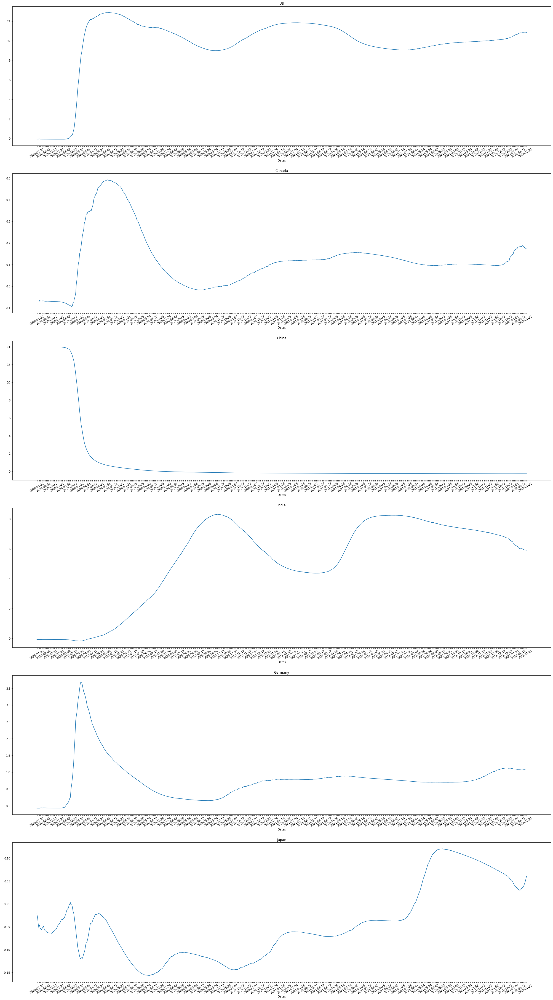

In [215]:
#Part 1 Question 3
Plotting(['US','Canada','China','India','Germany','Japan'],column_values)

Part 1 Question 4:

After standarization we can observe that the data represenation scale for the number of cases has been brought to a more neutral standpoint for different countries. Considering we take the mean to be the 0, balance point

When the curve goes up, we can see the number of cases are more than the mean. Hence there is an increase in the cases for that particular country and are positive. When the cases are below 0 which is our mean in this case, we can see that the cases are decreasing for that country, hence the values are negative.

US: When we observe the graph for US we see that initially for a small period of time the cases were not high, they were close to the mean, but as the days went on the cases started to increase drastically and the curve doesn't seem to be getting any closer to the mean.

Canada: The cases initially are lesser than the mean which was good ,but like US the cases in Canada also increase drastically and then also reduces gradually and then goes on an unstead curve that is not too far from the mean.

China: The curve starts of really high, very far off from the mean but then gradually gets closer to the mean and stay very close to the mean with very little deviation from the mean, meaning the cases are not too high.


# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (733, 733).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1) and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset with a `scree plot`(Bars for each component and a line to show cumulative --similar to tutorial. Limit x-axis if needed to better see the plot). **[0.25]**
4. How many PCs do you need to cover 98% of the dataset's variance? **[0.25]**
5. Plot the first 16 principal components (eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element). **[0.5]**
6. Compare the first few PCs with the rest of them. Do you see any differences in their trend? **[0.5]**

In [216]:
### YOUR CODE HERE ###
import numpy as np

S_Data=Scaled_Data.values
n,m=S_Data.shape
CovarMat=np.dot(S_Data.T,S_Data)/ (n-1)
print(CovarMat.shape)

(733, 733)


In [217]:
def get_sorted_eigen(df_cov):
  Eigenvalues,Eigenvectors=np.linalg.eigh(df_cov)
  Eigenvalues=Eigenvalues.tolist()
  Eigenvalues.reverse()
  Eigenvectors=Eigenvectors[:,::-1]
  return Eigenvalues,Eigenvectors

In [218]:
EigValues,EigVector=get_sorted_eigen(CovarMat)

In [219]:
eigValSum = sum(EigValues)
expVar = [eigV/eigValSum*100 for eigV in EigValues]
cumExpVar = np.cumsum(expVar)

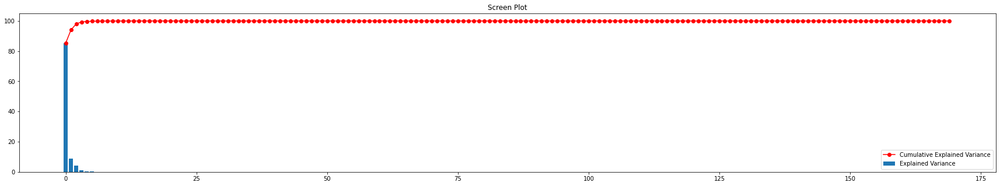

In [220]:
plt.figure(figsize=(30,5))
plt.bar(range(len(expVar[:170])), expVar[:170], label='Explained Variance')
plt.plot(cumExpVar[:170], 'r-o', label='Cumulative Explained Variance') 
plt.legend()
plt.title('Screen Plot')
plt.show()

In [221]:
print(f"The number of PC required to cover 98% of the dataset is {len(cumExpVar[cumExpVar<99.00])}")

The number of PC required to cover 98% of the dataset is 3


In [244]:
def Plotting2(EigVector,Dates):
  fig,axs= plt.subplots(8,2,figsize=(35, 85))
  plots=0
  for i in range(2):
    for j in range(8):
      plot_=sns.lineplot(ax=axs[j][i], x=Dates, y=EigVector[:,plots])
      #print(EigVector[:,plots])
      axs[j][i].set_title('PC'+str(plots+1))
      for ind, label in enumerate(plot_.get_xticklabels()):
        if ind % 10 == 0:  # every 10th label is kept(reduce the x axis labels)
            label.set_visible(True)
        else:
            label.set_visible(False)
      plot_.set_xticklabels(Dates,rotation = 60)
      plot_.set_xlabel("Dates")
      plots=plots+1
  plt.show()

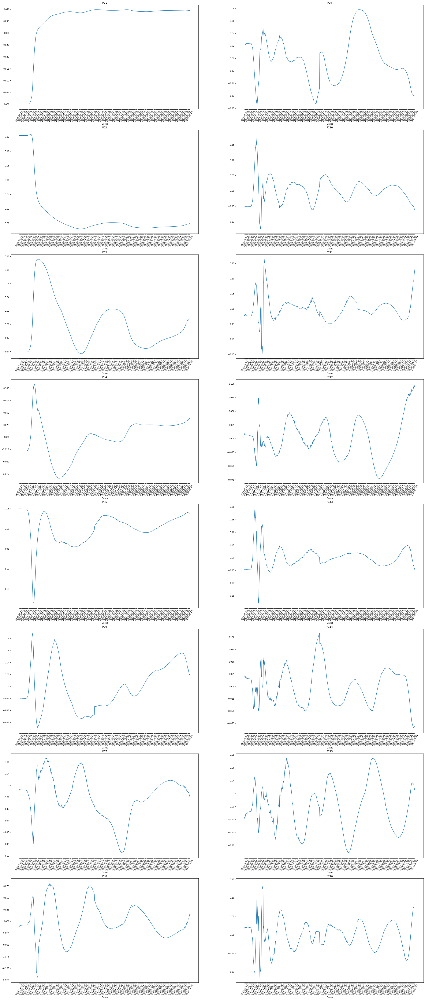

In [245]:
Plotting2(EigVector,list(column_values.values)[::-1])

As we see from the screen plot, there are only a handful of Principle components out of the total PC's that we need to get 98% of the data. Those are the first 3 PCs wth high eigen values. 
PC1 has the most variance and the variance keeps on decreasing. In the above plot we see the curve is smooth and as the PC's increase the smoothess of the curve becomes less making it more noisy.

# Part 3: Data reconstruction [3 Marks]

Create a function that:

*   Accepts a country and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigenvectors and eigenvalues. 
*   Plots 4 figures:
  1.   The original time-series for the specified country. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified country in a single plot. **[1]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable): 
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[0.5]**
      * Hint: You are plotting the error that we have for reconstructing each day `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error. 
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 100 (this part is independent from part 3.2.) **[0.5]**

Test your function using the `US`, `Canada`, and `China` as inputs. **[0.5]**

In [224]:
from sklearn.metrics import mean_squared_error

def plot_country_figures(original_df, country_name):
### Finding the eigenvalues and eigenvector ###
  scaler=StandardScaler()
  Scaled_data=scaler.fit_transform(original_df)
  row_values=original_df.index.to_numpy()
  indexx=np.where(row_values == country_name)
  n,m=Scaled_data.shape
  CovarMat=np.dot(Scaled_data.T,Scaled_data)/ (n-1)
  EigValues,EigVector=get_sorted_eigen(CovarMat)
  RMSE=[]
    
  #Original Time Series
  fig,axs= plt.subplots(2,2,figsize=(65, 45))
  plot_=sns.lineplot(ax=axs[0,0], x=original_df.columns.values, y=original_df.loc[country_name])
  axs[0,0].set_title(country_name,fontsize=20)
  axs[0,0].grid(visible=True,which='both',linestyle='--')
  for ind, label in enumerate(plot_.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept(reduce the x axis labels)
        label.set_visible(True)
    else:
        label.set_visible(False)
  plot_.set_xticklabels(original_df.columns.values,rotation = 60,fontsize=20)
  plot_.set_xlabel("Dates",fontsize=20)

  #Reconstruction with only PC1
  for In,Va in enumerate([1,2,4,8,16]):
    PC=Va
    W = EigVector[:,0:PC]
    projection=np.dot(Scaled_data,W)
    # Reconstruction
    ReconX = np.dot(projection, W.T)
    Recon_original=scaler.inverse_transform(ReconX)
    RMSE.append(mean_squared_error(original_df.values[indexx][0],Recon_original[indexx][0],squared=False))
    plot_=sns.lineplot(ax=axs[0,1], x=original_df.columns.values, y=Recon_original[indexx][0],linewidth = 5)
    plot_.legend(labels=["PC=1","PC=2","PC=4","PC=8","PC=16"], fontsize = 20)
  plot_.set_xticklabels(original_df.columns.values,rotation = 60,fontsize=20)
  axs[0,1].set_title('PC values',fontsize=20)
  axs[0,1].grid(visible=True,which='both',linestyle='--')
  for ind, label in enumerate(plot_.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept(reduce the x axis labels)
        label.set_visible(True)
    else:
        label.set_visible(False)
  plot_.set_xlabel("Dates",fontsize=20)

  #Residual Error with best reconstruction
  PC=16
  W = EigVector[:,0:PC]
  projection=np.dot(Scaled_data,W)
  ReconX = np.dot(projection, W.T)
  Recon_original=scaler.inverse_transform(ReconX)
  Residual_Error=original_df.values-Recon_original
  plot_=sns.lineplot(ax=axs[1,0], x=original_df.columns.values, y=Residual_Error[indexx][0],linewidth = 5)
  plot_.legend(labels=["PC=16"], fontsize = 20)
  plot_.set_xticklabels(original_df.columns.values,rotation = 60,fontsize=20)
  axs[1,0].set_title('Residual Error',fontsize=20)
  axs[1,0].grid(visible=True,which='both',linestyle='--')
  for ind, label in enumerate(plot_.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept(reduce the x axis labels)
        label.set_visible(True)
    else:
        label.set_visible(False)
  plot_.set_xlabel("Dates",fontsize=20)

  #RMSE
  plot_=sns.lineplot(ax=axs[1,1], x=[1,2,4,8,16], y=RMSE)
  plot_.legend(labels=["RMSE"], fontsize = 20)
  axs[1,1].set_title('RMSE',fontsize=20)
  axs[1,1].grid(visible=True,which='both',linestyle='--')
  plot_.set_xlabel("Principle Components",fontsize=20)
  plot_.set_ylabel("RMSE",fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.show()

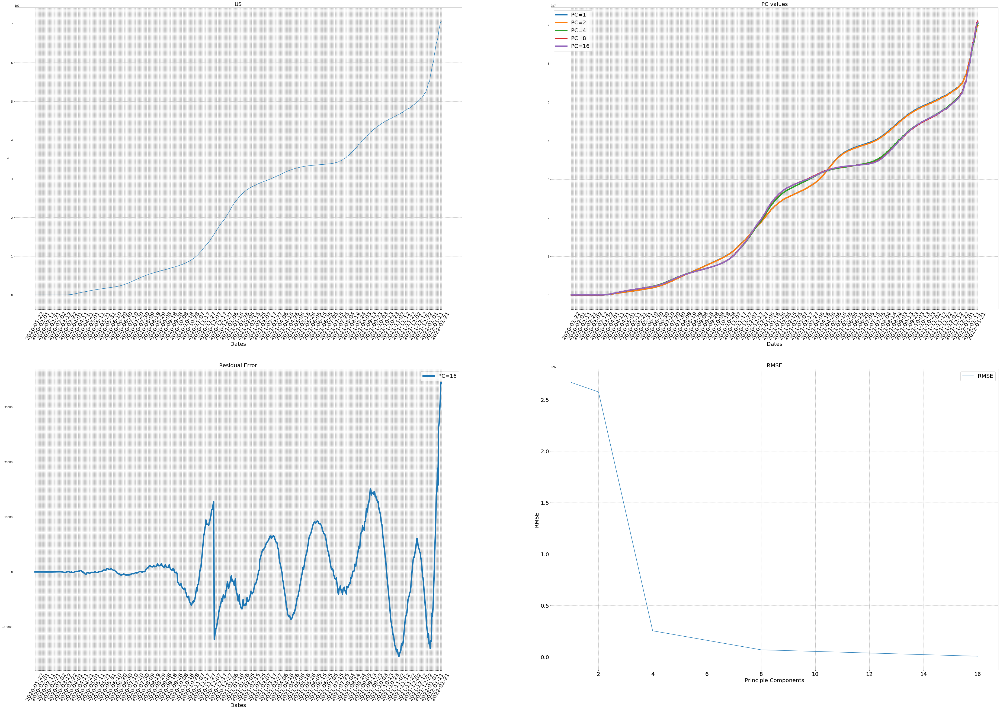

In [225]:
plot_country_figures(cases_raw,'US')

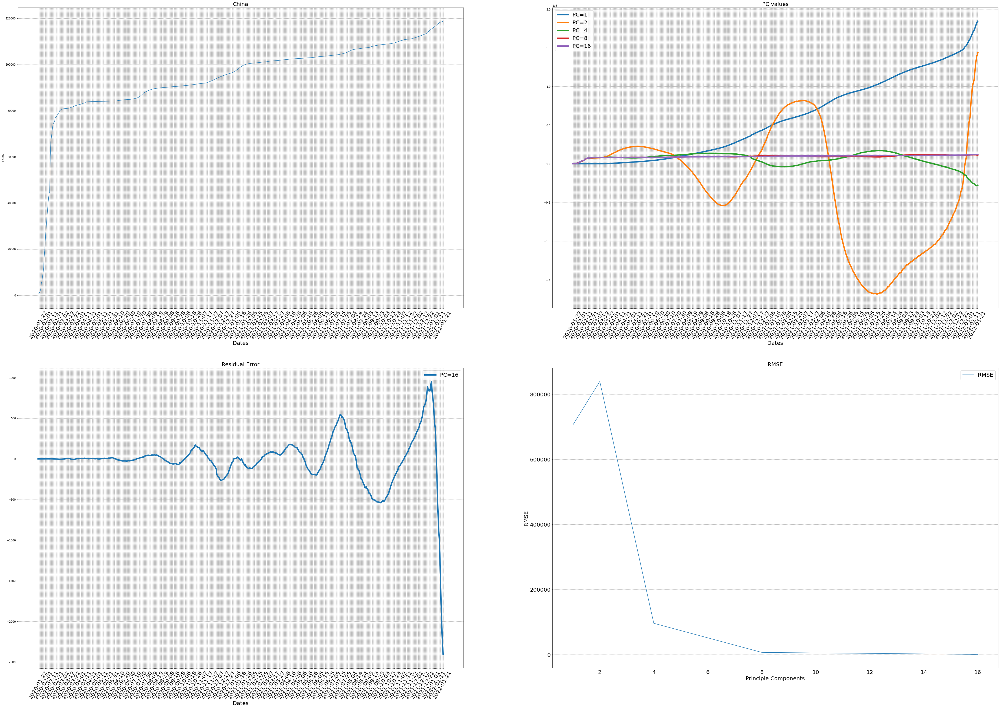

In [226]:
plot_country_figures(cases_raw,'China')

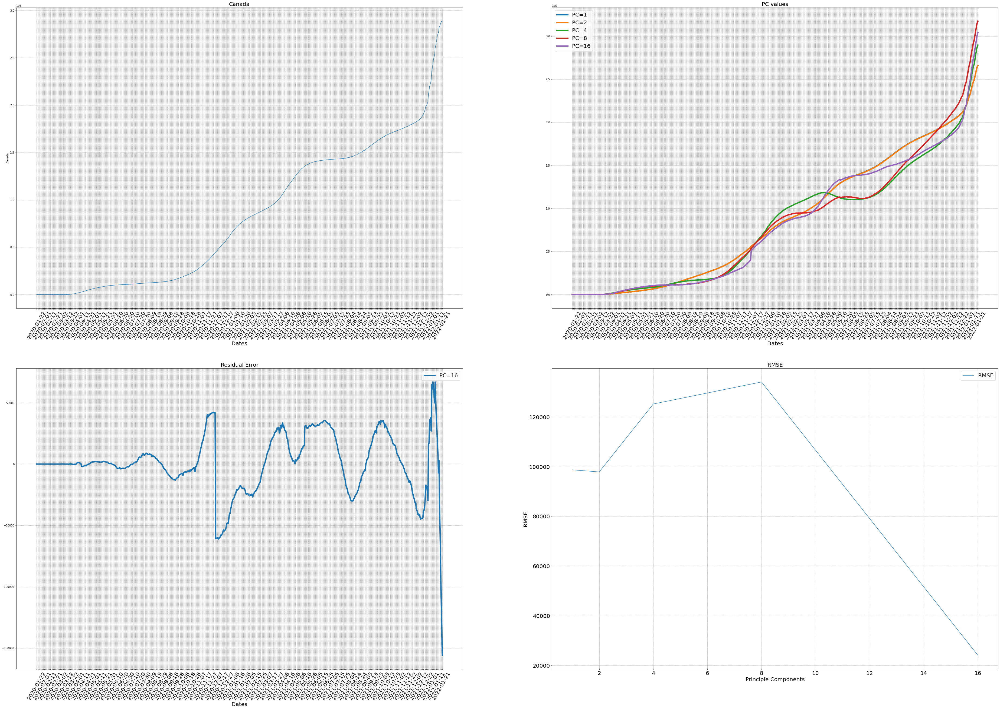

In [227]:
plot_country_figures(cases_raw,'Canada')

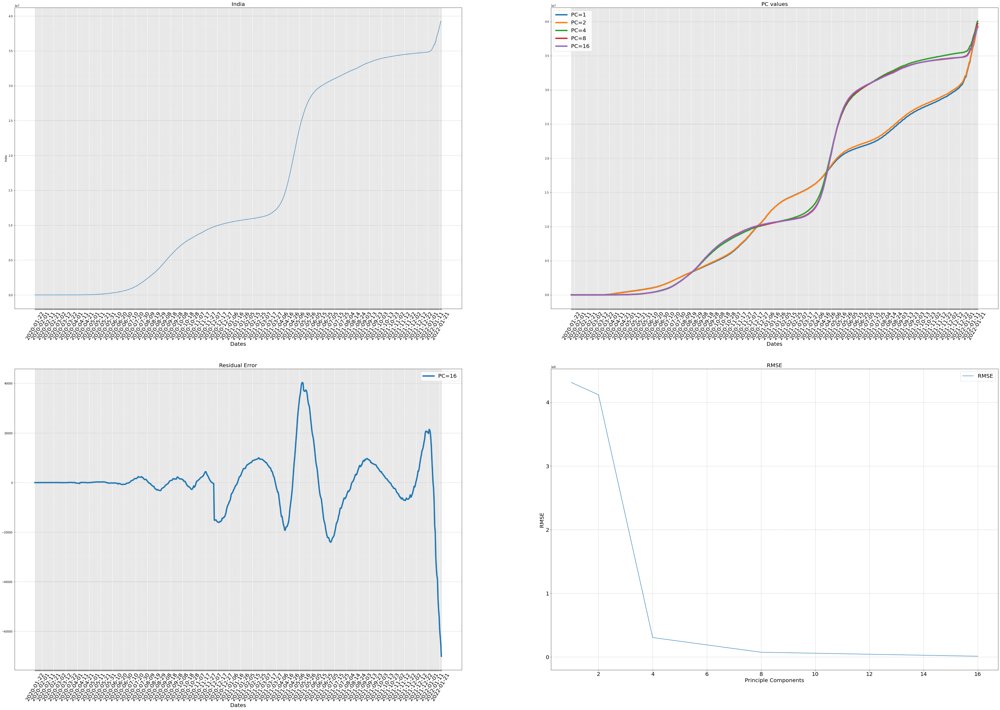

In [228]:
plot_country_figures(cases_raw,'India')

# Part 4: SVD [2 Marks]
Modify your function in part 3 to use SVD instead of PCA for extracting the eigenvectors. **[0.5]**

Explain if standardization or covariance computation is required for this part.**[0.5]**

Repeat part 3 and compare your PCA and SVD results. **[1]**



In [229]:
### YOUR CODE HERE ###
def SVD(original_df, country_name):
### Finding the eigenvalues and eigenvector ###
  row_values=original_df.index.to_numpy()
  indexx=np.where(row_values == country_name)
  U, S, V = np.linalg.svd(original_df.values.T)
  RMSE=[]
    
  #Original Time Series
  fig,axs= plt.subplots(2,2,figsize=(65, 45))
  plot_=sns.lineplot(ax=axs[0,0], x=original_df.columns.values, y=original_df.loc[country_name])
  axs[0,0].set_title(country_name,fontsize=20)
  axs[0,0].grid(visible=True,which='both',linestyle='--')
  for ind, label in enumerate(plot_.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept(reduce the x axis labels)
        label.set_visible(True)
    else:
        label.set_visible(False)
  plot_.set_xticklabels(original_df.columns.values,rotation = 60,fontsize=20)
  plot_.set_xlabel("Dates",fontsize=20)

  #Reconstruction with different singular value
  for In,Va in enumerate([1,2,4,8,16]):
    Singular=Va
    Recon_original = (U[:,0:Va] * S[0:Va])@V[0:Va,:]
    RMSE.append(mean_squared_error(original_df.values[indexx][0],Recon_original.T[indexx][0],squared=False))
    plot_=sns.lineplot(ax=axs[0,1], x=original_df.columns.values, y=Recon_original.T[indexx][0],linewidth = 5)
    plot_.legend(labels=["Singular value = 1","Singular value = 2","Singular value = 4","Singular value = 8","Singular value = 16"], fontsize = 20)
  plot_.set_xticklabels(original_df.columns.values,rotation = 60,fontsize=20)
  axs[0,1].set_title('Singular values',fontsize=20)
  axs[0,1].grid(visible=True,which='both',linestyle='--')
  for ind, label in enumerate(plot_.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept(reduce the x axis labels)
        label.set_visible(True)
    else:
        label.set_visible(False)
  plot_.set_xlabel("Dates",fontsize=20)

  #Residual Error with best reconstruction
  Singular=16
  Recon_original = (U[:,0:Va] * S[0:Va])@V[0:Va,:]
  Residual_Error=original_df.values-Recon_original.T
  plot_=sns.lineplot(ax=axs[1,0], x=original_df.columns.values, y=Residual_Error[indexx][0],linewidth = 5)
  plot_.legend(labels=["Singular value = 16"], fontsize = 20)
  plot_.set_xticklabels(original_df.columns.values,rotation = 60,fontsize=20)
  axs[1,0].set_title('Residual Error',fontsize=20)
  axs[1,0].grid(visible=True,which='both',linestyle='--')
  for ind, label in enumerate(plot_.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept(reduce the x axis labels)
        label.set_visible(True)
    else:
        label.set_visible(False)
  plot_.set_xlabel("Dates",fontsize=20)

  #RMSE
  plot_=sns.lineplot(ax=axs[1,1], x=[1,2,4,8,16], y=RMSE)
  plot_.legend(labels=["RMSE"], fontsize = 20)
  axs[1,1].set_title('RMSE',fontsize=20)
  axs[1,1].grid(visible=True,which='both',linestyle='--')
  plot_.set_xlabel("Singular values",fontsize=20)
  plot_.set_ylabel("RMSE",fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.show()

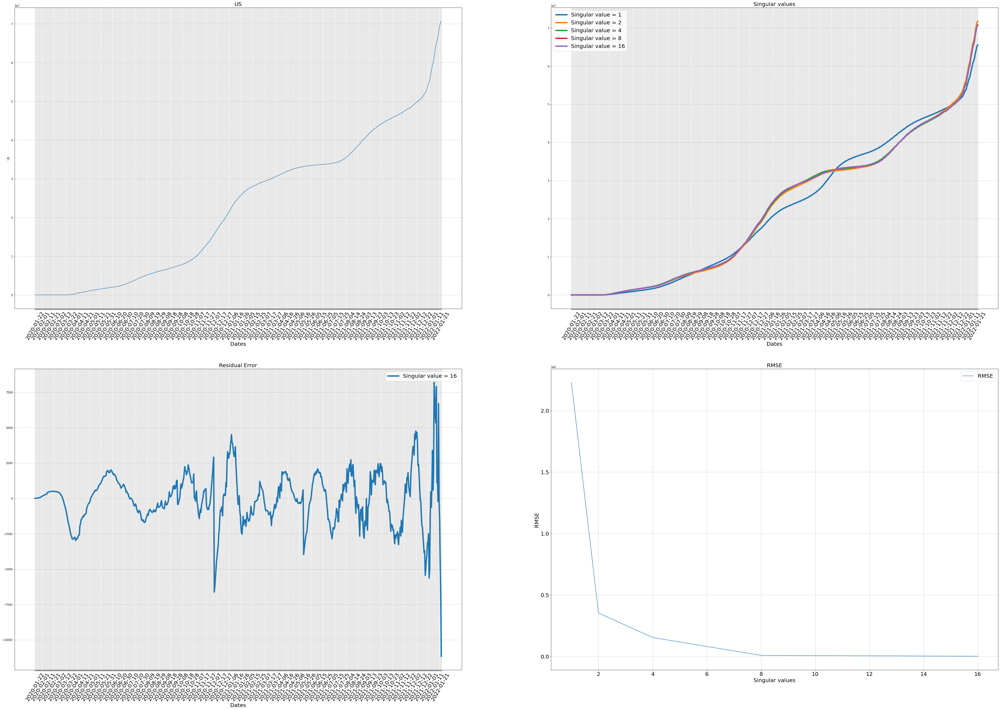

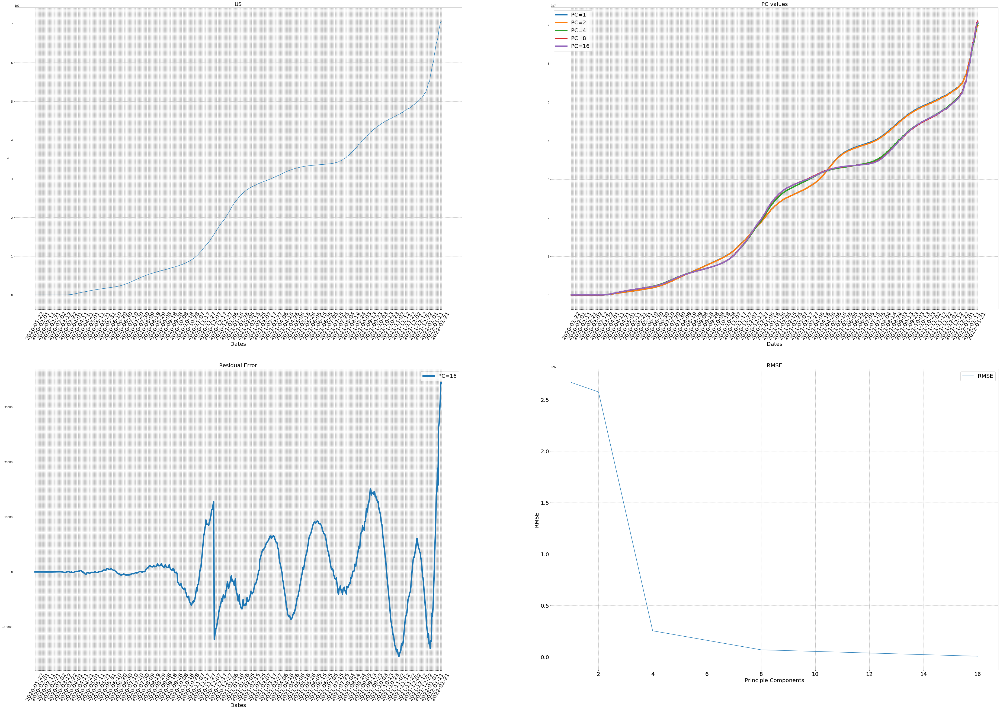

In [230]:
SVD(cases_raw,'US')
plot_country_figures(cases_raw,'US')

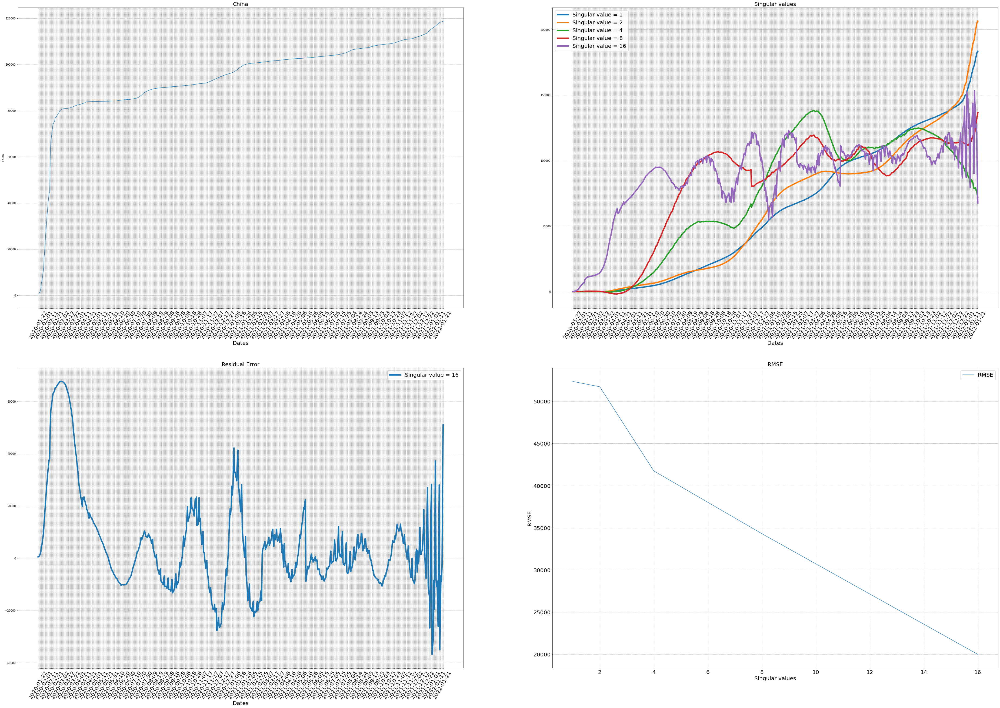

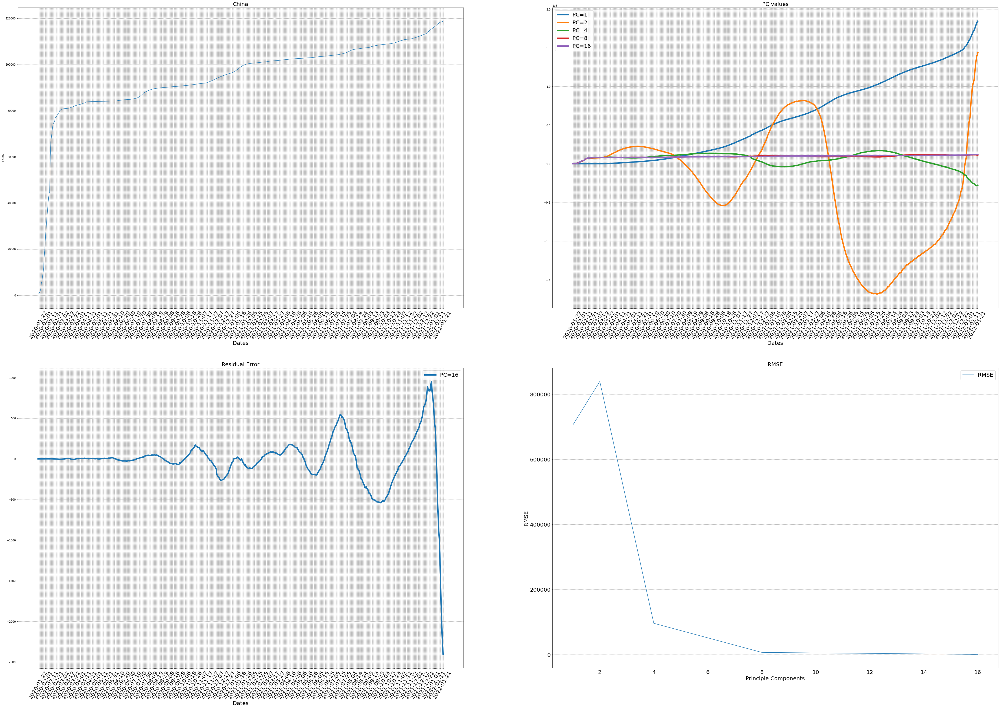

In [231]:
SVD(cases_raw,'China')
plot_country_figures(cases_raw,'China')

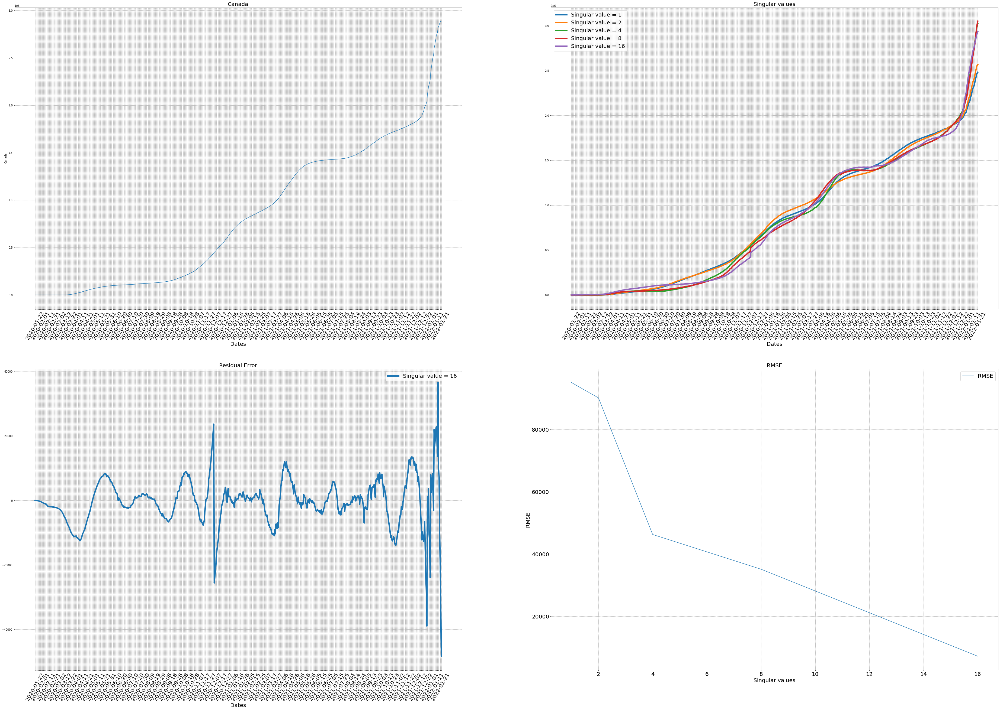

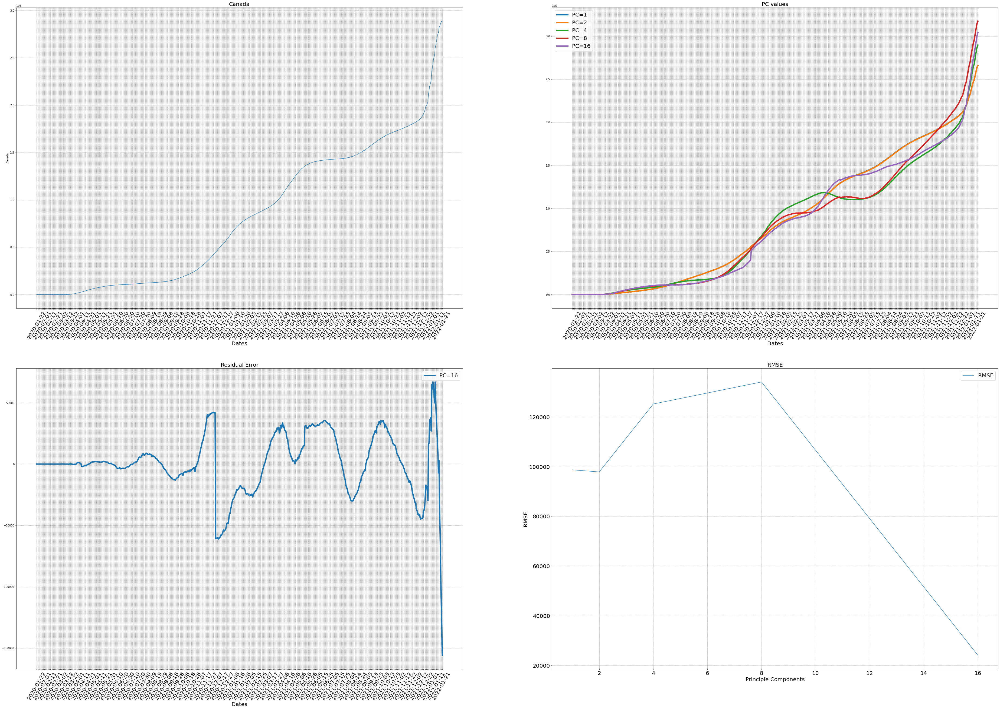

In [232]:
SVD(cases_raw,'Canada')
plot_country_figures(cases_raw,'Canada')

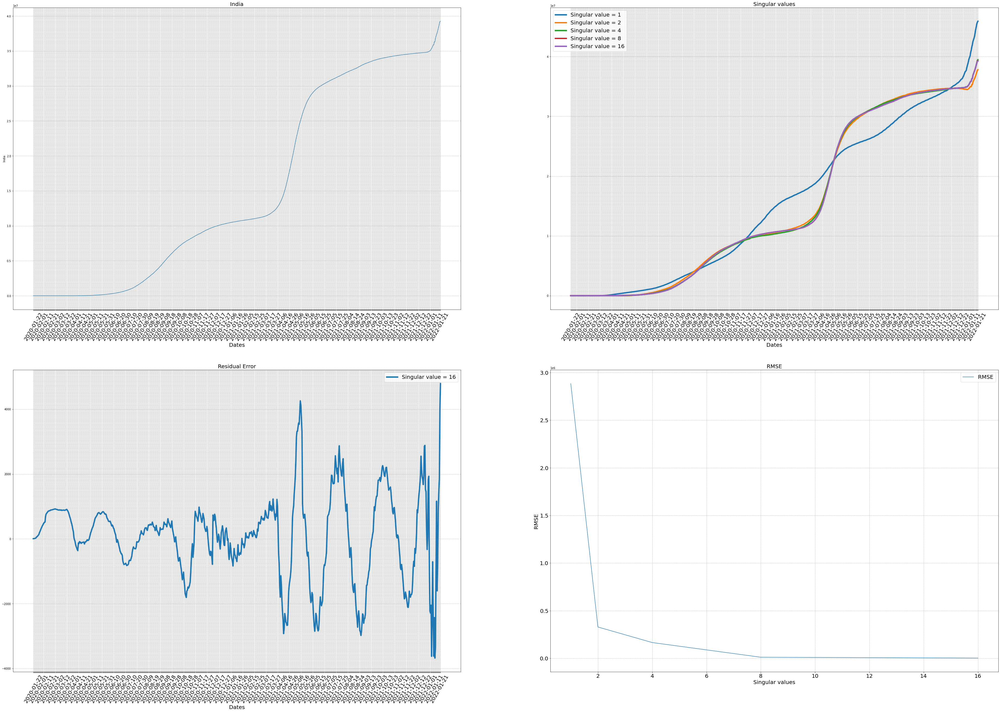

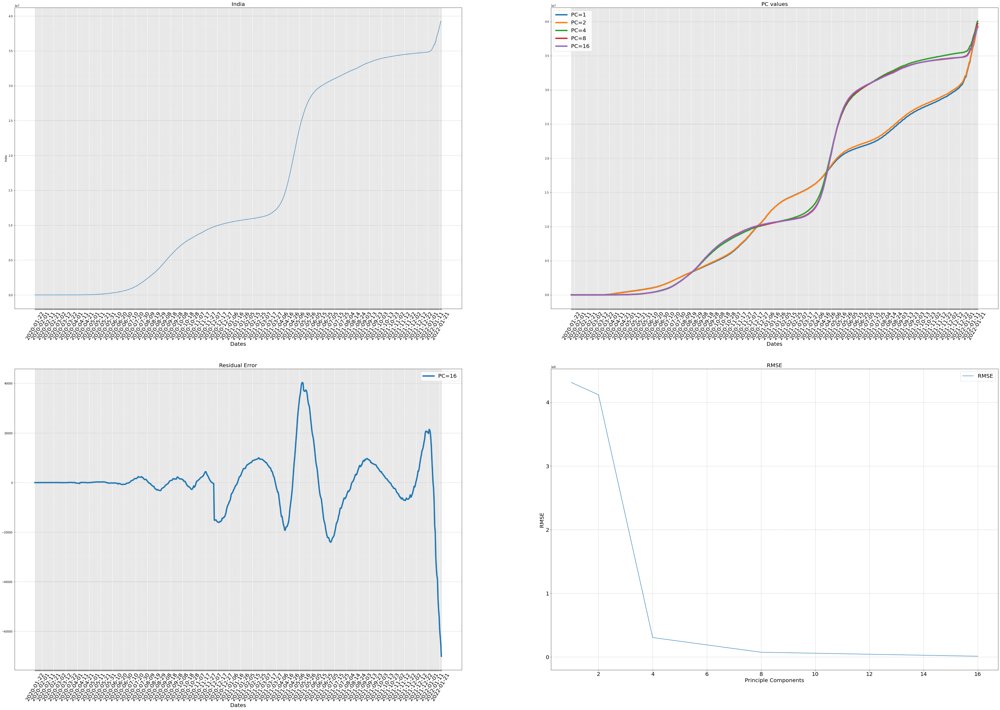

In [233]:
SVD(cases_raw,'India')
plot_country_figures(cases_raw,'India')

For SVD we dont standardise the data or calculate covariance matrix as we do not calculate the eigenvalues or eigenvectors. We calcualte the right singular matrix(V) and the left singular matrix(U) and the S is the diagonal matrix with singular values as the diagonal elements.

When we compare the results of both SVD and PCA reconstructions we see that the residual error for countries such as US, Canada, India are lesser when we perform SVD than PCA and for countries such as China, the residual error is more when we perform SVD than PCA.  
Based on the observations for reconstruction it takes lesser number of singular values than principle components. What may require 4 PC's to acheive in PCA make take 2 Singular values in SVD

# Part 5: Fashion-MNIST dataset [2 Marks]
Fashion-MNIST is a dataset for clothes. 
Each image in Fashion-MNIST has 28x28 pixels which can be represented in an array with 784 elements. You can take a better look at this dataset in this [link](https://www.openml.org/d/40996) 

In this part, we are going to use PCA to compress these images. The $x$ matrix below has 1000 images.
* Create a new dataset by selecting images from *only* three categories (three distinct labels). 
    * To compress and reconstruct images better with PCA, it is better to choose items that are similar in shape. Why? **[0.25]**
* Compute Eigenvectors and Eigenvalues using SVD. **[0.25]**
* Plot the first 10 eigenvectors (as images similar to eigenfaces). What trends do you observe? **[0.25]**
* Create a function that requires an argument $n$ and plots a random image from the dataset, as well as a reconstruction with the first $n$ principal components. **[0.5]**
* Run your function a few times and determine how many components are required so that we (humans!) can identify the items. **[0.25]**
* Assume you want to share this dataset with someone else. Instead of directly giving them the whole dataset, you can share the eigenvectors (some of them) and projections with them, and they can do a dot product to get the reconstructions.  Based on the number of components that you found in the last step, what would be the compression ratio for a dataset with 1000 images? **[0.5]**
  * Hint: compare the dataset size with a case where we only use some principal components and projections.

In [234]:
from sklearn.datasets import fetch_openml
import pandas as pd
mnist = fetch_openml("Fashion-MNIST")
x = mnist.data[0:1000]
y = mnist.target[0:1000]
target_encoding = {0: "T-shirt/top",
1: "Trouser",
2: "Pullover",
3: "Dress",
4: "Coat",
5: "Sandal",
6: "Shirt",
7: "Sneaker",
8: "Bag",
9: "Ankle boot"}

In [235]:
x.shape

(1000, 784)

Label is: Ankle boot


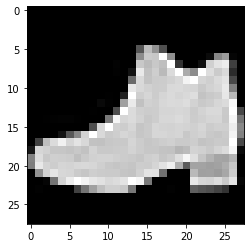

In [236]:
import matplotlib.pyplot as plt 
plt.gray() 
ind = 15
plt.imshow(x.loc[ind].values.reshape(28,28)) 
print ("Label is:", target_encoding[int(y[ind])])
plt.show() 

In [237]:
x['Class'] = y
x
#Creating new Dataframe
DF=x.loc[(x['Class']=='3') | (x['Class']=='4') | (x['Class']=='6')]
DF=DF.drop('Class', axis=1)
DF.values
DF.values.shape
x=x.drop("Class",axis=1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [238]:
DF

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0,96.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,6.0,36.0,...,0.0,0.0,0.0,0.0,15.0,160.0,100.0,0.0,0.0,0.0
19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,60.0,56.0,67.0,22.0,0.0,2.0,0.0,0.0,0.0,0.0
20,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,65.0,...,199.0,207.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,149.0,159.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
982,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,2.0,0.0,16.0,142.0,66.0,33.0,0.0,0.0
987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
993,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,178.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0


# **We choose 3 similar classes because its easier for reconstruction as the images are similar, the correlation is high between the images**

In [239]:
import numpy as np
import random as rd
# Finding out the EigenValues and EigenVectors
U, S, Vh = np.linalg.svd(DF.values)
Sigma = np.zeros((DF.shape[0], DF.shape[1]))
Sigma[:DF.shape[1], :DF.shape[0]] = np.diag(S)
EigenValues=(Sigma**2)/(S.shape[0]-1)
EigenVectors=Vh.T

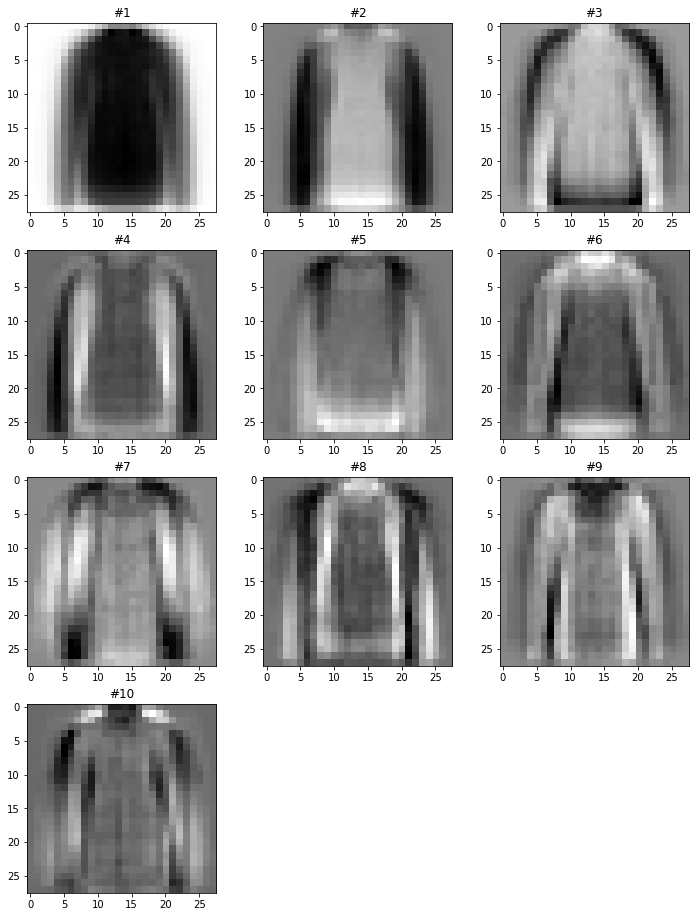

In [240]:
import math
# Plotting the first 10 eigenvectors
COUNT = 10
ROWS = math.ceil(COUNT/3)
fig = plt.figure(figsize=(12, ROWS * 4))
for i in range(0, COUNT):
    plt.subplot(ROWS, 3, i+1)
    plt.imshow(EigenVectors[:,i].reshape(28, 28), cmap = plt.cm.gray)
    plt.title('#{}'.format(i+1))

# **The 10 eigenvectors have features from the 3 classes selected and they all are different from each other. Each vector has a mix of 3 different class images. So the more the eigen vectors we merge and mutiply with the projections we can use those to reconstruct a particular image**

In [241]:
def plot_reconstruction(n): 
  plt.figure(figsize=(10,15))
  plt.subplot(1,2,1)
  plt.gray() 
  ind = DF.index.values[rd.randint(0,len(DF.index.values)-1)]
  plt.imshow(DF.loc[ind].values.reshape(28,28)) 
  plt.title(f"Original Image, Label is: {target_encoding[int(y[ind])]}")


  #Reconstruction with only PC
  plt.subplot(1,2,2)
  PC=n
  W = EigenVectors[:, 0:PC]
  projection=np.dot(DF.loc[ind].values.reshape(1,-1),W)
  # Reconstruction
  ReconX = np.dot(projection, W.T)
  Image=ReconX.reshape(28,28)
  plt.imshow(Image, cmap = plt.cm.gray)
  plt.title(f"Reconstructed Image with {PC} principle component")
  

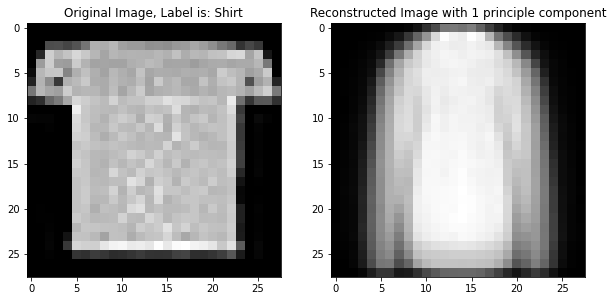

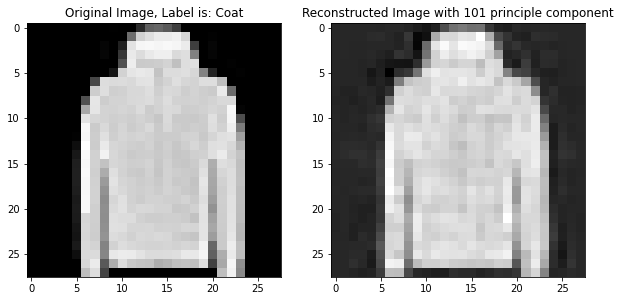

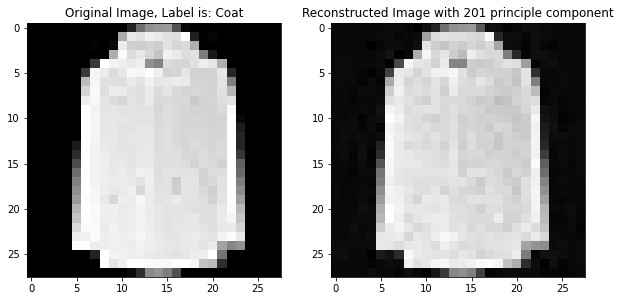

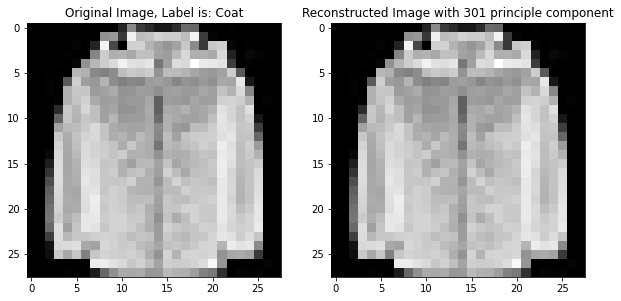

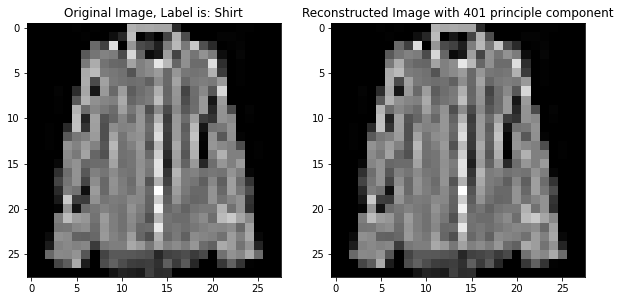

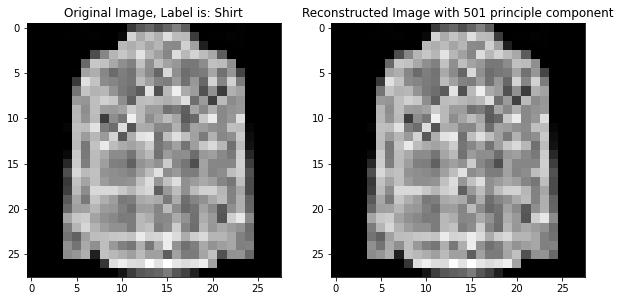

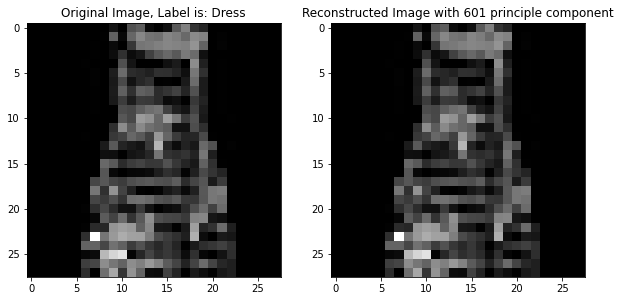

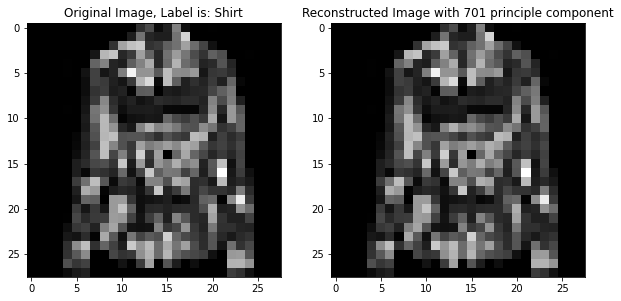

In [242]:
for check in range(1,785,100):
  plot_reconstruction(check)

# **As we can observe the more PC we include to reconstruct the image the better the reconstruction. At around 201 - 300 PC are close to get a reconstruction close to the actual image and also be determined by humans**

# The Dataset DF to 287x784, that is 287 images and 784 pixels There the total size is 225,008 elements

#The size of the eigenvector matrix in this case as we do SVD, so the size of V is 784x784

#The number of PC we require is in the range of 201 - 300, so we can say our V size varies from 784x201 to 784x301

#Now our project matrix has values in range of 1x201 and 1x301

#So the total size for reconstruction is within W_op(784x201), P(1x201) and W_op(784x301), P(1x301)
#The total number of elements for reconstruction are between 157,785 and 236,285

#Hence the compression ratio is between 0.70 - 1.05

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Covid Data:

1. https://www.worldometers.info/coronavirus/

2. https://datahub.io/core/covid-19#resource-time-series-19-covid-combined

